# Ejemplo para el hito 3 del curso

Necesitaremos algunas bibliotecas extras:

`pip install wordfreq pyarrow dask wordcloud`

Utilizaremos tres fuentes de datos:

* Población del censo 2024.
* Resultados preliminares del SERVEL de las elecciones presidenciales 2025, primera vuelta.
* Datos agregados de SOSAFE recolectados a partir de su visor público.



In [1]:
import dask.dataframe as dd

In [2]:
from chiricoca.config import setup_style

setup_style(dpi=256)

# Datos Servel

In [3]:
df = dd.read_csv('data/presidenciales-2025-1ra/resultados_*.csv').compute()

In [4]:
df.groupby('adm_region')['total_votacion'].sum().sum()

13388455

In [5]:
df['total_votacion'].sum()

13388455

In [6]:
df.columns

Index(['adm_region', 'adm_provincia', 'adm_comuna', 'adm_local',
       'EDUARDO ANTONIO ARTES BRICHETTI', 'EVELYN MATTHEI FORNET',
       'FRANCO PARISI FERNANDEZ', 'HAROLD MAYNE-NICHOLLS SECUL',
       'JEANNETTE JARA ROMAN', 'JOHANNES KAISER BARENTS-VON HOHENHAGEN',
       'JOSE ANTONIO KAST RIST', 'MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO',
       'validamente_emitidos', 'votos_nulos', 'votos_blancos',
       'total_votacion'],
      dtype='object')

In [7]:
turnout = df[['EDUARDO ANTONIO ARTES BRICHETTI', 'EVELYN MATTHEI FORNET',
       'FRANCO PARISI FERNANDEZ', 'HAROLD MAYNE-NICHOLLS SECUL',
       'JEANNETTE JARA ROMAN', 'JOHANNES KAISER BARENTS-VON HOHENHAGEN',
       'JOSE ANTONIO KAST RIST', 'MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO', 'votos_nulos', 'votos_blancos']].sum()

(turnout / turnout.sum()).sort_values()

EDUARDO ANTONIO ARTES BRICHETTI           0.006387
votos_blancos                             0.010603
MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO    0.011526
HAROLD MAYNE-NICHOLLS SECUL               0.012127
votos_nulos                               0.026931
EVELYN MATTHEI FORNET                     0.119738
JOHANNES KAISER BARENTS-VON HOHENHAGEN    0.134148
FRANCO PARISI FERNANDEZ                   0.190520
JOSE ANTONIO KAST RIST                    0.230569
JEANNETTE JARA ROMAN                      0.257450
dtype: float64

<Axes: >

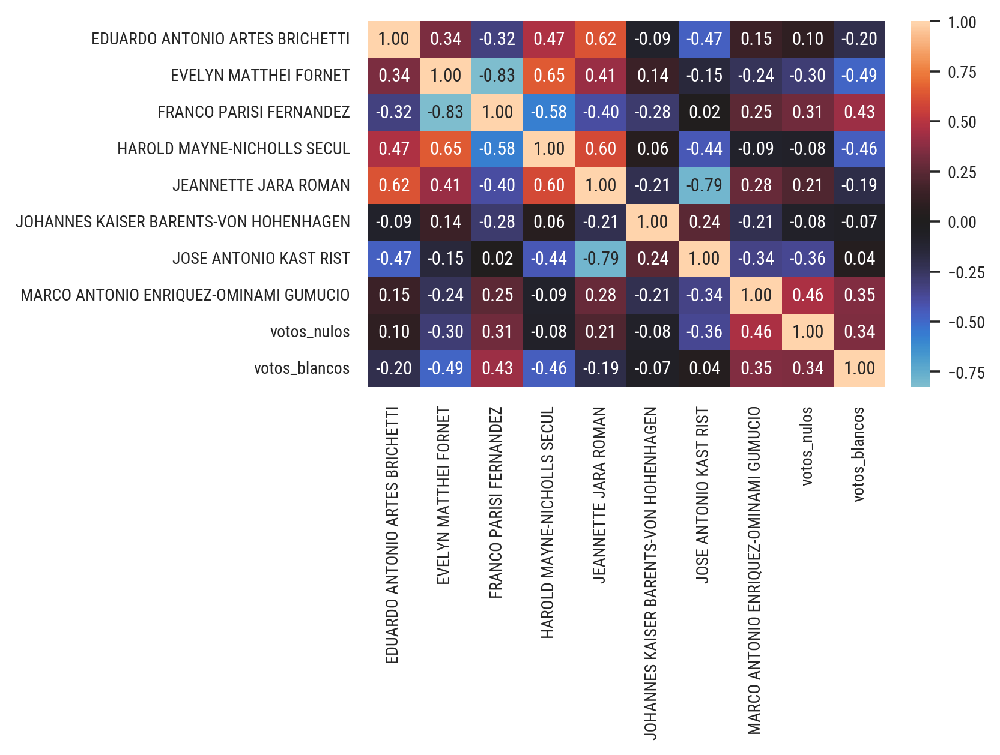

In [8]:
from chiricoca.base.weights import normalize_rows
import seaborn as sns 

correlations = (
    df[
        [
            "EDUARDO ANTONIO ARTES BRICHETTI",
            "EVELYN MATTHEI FORNET",
            "FRANCO PARISI FERNANDEZ",
            "HAROLD MAYNE-NICHOLLS SECUL",
            "JEANNETTE JARA ROMAN",
            "JOHANNES KAISER BARENTS-VON HOHENHAGEN",
            "JOSE ANTONIO KAST RIST",
            "MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO",
            "votos_nulos",
            "votos_blancos",
        ]
    ]
    .pipe(normalize_rows)
    .corr(method="spearman")
)

sns.heatmap(correlations, center=0, annot=True, fmt=".2f")

In [9]:
regional_correlations = []

for region in df["adm_region"].unique():
    group = df[df["adm_region"] == region][
        [
            "EDUARDO ANTONIO ARTES BRICHETTI",
            "EVELYN MATTHEI FORNET",
            "FRANCO PARISI FERNANDEZ",
            "HAROLD MAYNE-NICHOLLS SECUL",
            "JEANNETTE JARA ROMAN",
            "JOHANNES KAISER BARENTS-VON HOHENHAGEN",
            "JOSE ANTONIO KAST RIST",
            "MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO",
            "votos_nulos",
            "votos_blancos",
        ]
    ].pipe(normalize_rows)
    reg_corr = group.corr(method="spearman")["FRANCO PARISI FERNANDEZ"].drop(
        "FRANCO PARISI FERNANDEZ"
    )
    regional_correlations.append(reg_corr)

<Axes: ylabel='adm_region'>

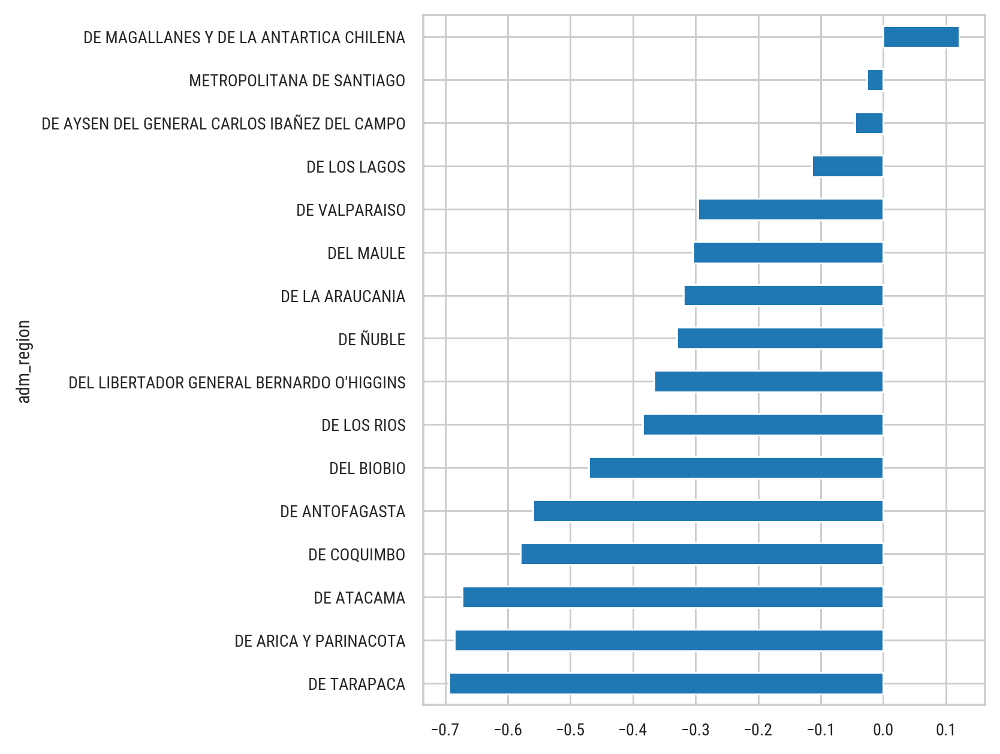

In [10]:
import pandas as pd

parisi_correlations = (
    pd.DataFrame.from_records(regional_correlations)
    .assign(adm_region=df["adm_region"].unique())
    .set_index("adm_region")
)

parisi_correlations['JEANNETTE JARA ROMAN'].sort_values().plot(kind='barh')

In [11]:
from chiricoca.geo.utils import to_point_geodataframe

locales = to_point_geodataframe(
    pd.read_csv("data/presidenciales-2025-1ra/locales_geolocalizados.csv"),
    "lon",
    "lat",
    drop=True,
).drop(["direccion_encontrada", "fuente"], axis=1)

locales

,adm_region,adm_provincia,adm_comuna,adm_local,geometry
0,METROPOLITANA DE SANTIAGO,SANTIAGO,CERRO NAVIA,ESCUELA ALIANZA,POINT (-70.76225 -33.41491)
1,DEL MAULE,TALCA,PELARCO,ESCUELA PABLO CORREA MONTT,POINT (-71.34808 -35.38296)
2,METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,CENTRO EDUCATIVO REPUBLICA MEXICANA,POINT (-70.66525 -33.48877)
3,METROPOLITANA DE SANTIAGO,TALAGANTE,PEÑAFLOR,ESCUELA TERESA DE CALCUTA,POINT (-70.90350 -33.61140)
4,DE VALPARAISO,LOS ANDES,CALLE LARGA,POLIDEPORTIVO MUNICIPAL CALLE LARGA,POINT (-70.61949 -32.85030)
...,...,...,...,...,...
3372,METROPOLITANA DE SANTIAGO,TALAGANTE,TALAGANTE,LICEO POLITECNICO C-120 L2,POINT (-70.92389 -33.66478)
3373,METROPOLITANA DE SANTIAGO,TALAGANTE,TALAGANTE,LICEO REPUBLICA DE GRECIA,POINT (-70.92371 -33.66392)
3374,METROPOLITANA DE SANTIAGO,TALAGANTE,TALAGANTE,LICEO TALAGANTE BASICA,POINT (-70.92286 -33.66529)
3375,METROPOLITANA DE SANTIAGO,TALAGANTE,TALAGANTE,LICEO TALAGANTE MEDIA L1,POINT (-70.92286 -33.66529)


# Grilla

<Axes: >

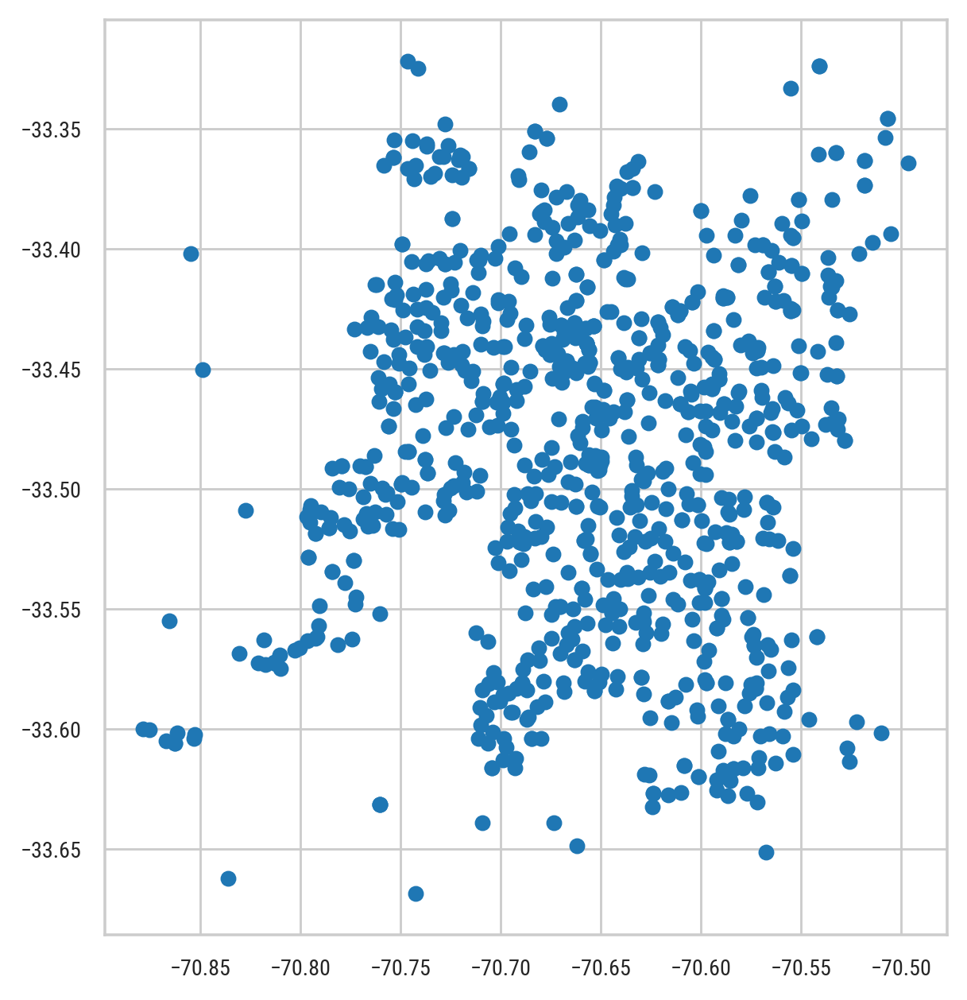

In [12]:
import geopandas as gpd
from chiricoca.geo.utils import clip_point_geodataframe

scl_bounds = [-70.88006218, -33.67612715, -70.43015094, -33.31069169]

scl_locales = clip_point_geodataframe(locales.merge(df), scl_bounds)
scl_locales.plot()

<Axes: >

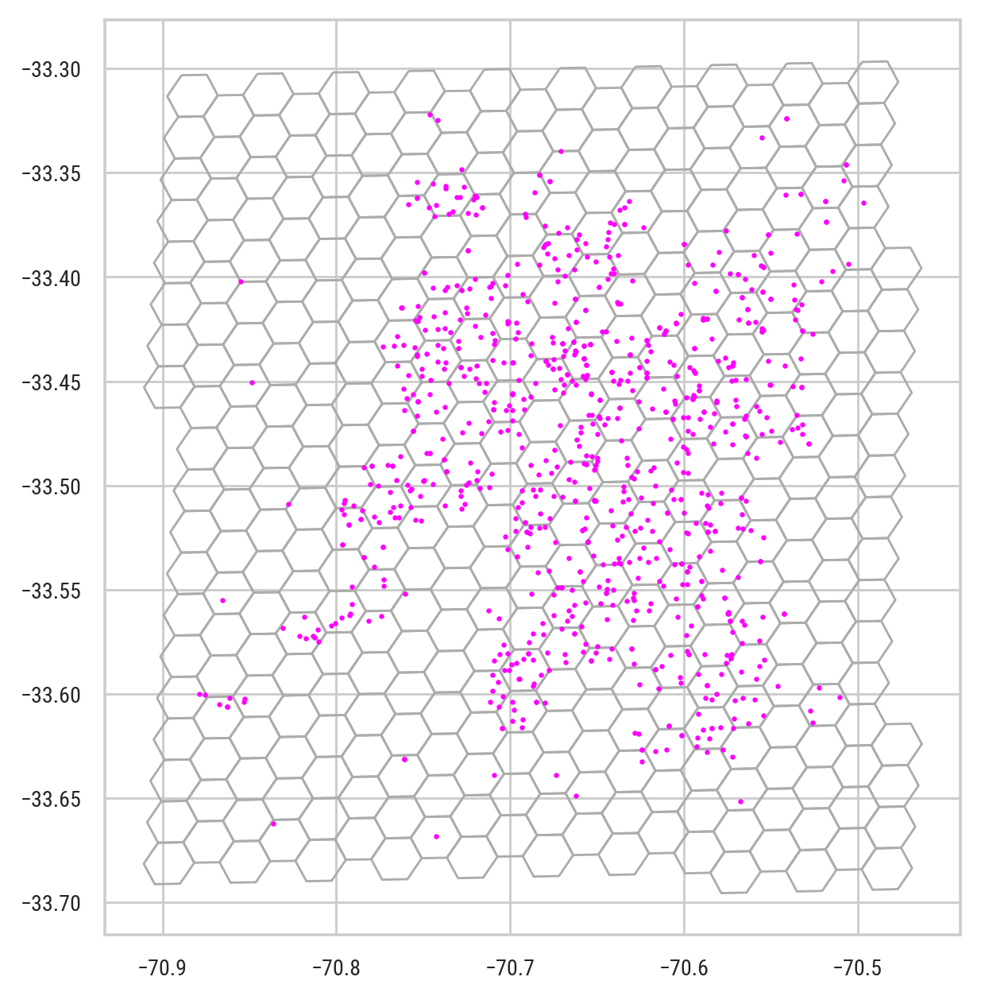

In [13]:
from chiricoca.geo.grid import h3_grid_from_bounds

grid = h3_grid_from_bounds(scl_locales.total_bounds, extra_margin=0.05, grid_level=7)
ax = grid.plot(facecolor="none", edgecolor="#abacab")
scl_locales.plot(ax=ax, color="magenta", markersize=1)

In [14]:
grid.to_file('data/presidenciales-2025-1ra/grid.json', driver='GeoJSON')

In [15]:
df_grid = gpd.sjoin(scl_locales.merge(df), grid, predicate="within")

In [16]:
grid_turnout = df_grid.groupby("index_right")[
    [
        "EDUARDO ANTONIO ARTES BRICHETTI",
        "EVELYN MATTHEI FORNET",
        "FRANCO PARISI FERNANDEZ",
        "HAROLD MAYNE-NICHOLLS SECUL",
        "JEANNETTE JARA ROMAN",
        "JOHANNES KAISER BARENTS-VON HOHENHAGEN",
        "JOSE ANTONIO KAST RIST",
        "MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO",
        "votos_nulos",
        "votos_blancos",
    ]
].sum()

grid_turnout.head()

,EDUARDO ANTONIO ARTES BRICHETTI,EVELYN MATTHEI FORNET,FRANCO PARISI FERNANDEZ,HAROLD MAYNE-NICHOLLS SECUL,JEANNETTE JARA ROMAN,JOHANNES KAISER BARENTS-VON HOHENHAGEN,JOSE ANTONIO KAST RIST,MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO,votos_nulos,votos_blancos
index_right,,,,,,,,,,
87b2c5082ffffff,49,1479,736,156,2108,821,1490,71,163,54
87b2c5084ffffff,242,4425,5191,510,9807,3725,6237,502,984,384
87b2c5086ffffff,138,3408,1297,300,4454,1579,3129,157,274,116
87b2c5090ffffff,358,6989,4930,816,14579,5248,8145,612,1090,416
87b2c5091ffffff,597,9584,6684,1157,22368,7500,11912,775,1646,463


In [17]:
from chiricoca.base.weights import normalize_rows, tfidf

grid_turnout_norm = grid.join(
    grid_turnout.pipe(
        lambda x: tfidf(x, norm="l2", smooth_idf=True, sublinear_tf=True)
    )
)


grid_values = grid_turnout_norm.drop(["geometry"], axis=1).stack()

In [18]:
total_turnout_scl = (
    grid_turnout.sum().sort_values(ascending=False)
)

total_turnout_scl

JEANNETTE JARA ROMAN                      1403493
JOSE ANTONIO KAST RIST                     922845
EVELYN MATTHEI FORNET                      748251
FRANCO PARISI FERNANDEZ                    593834
JOHANNES KAISER BARENTS-VON HOHENHAGEN     557392
votos_nulos                                114370
HAROLD MAYNE-NICHOLLS SECUL                 65588
MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO      55215
votos_blancos                               40027
EDUARDO ANTONIO ARTES BRICHETTI             34912
dtype: int64

In [19]:
import numpy as np

grid_bins = np.linspace(grid_values.min(), grid_values.max(), 7)
grid_bins

array([0.12820119, 0.19207093, 0.25594067, 0.3198104 , 0.38368014,
       0.44754988, 0.51141961])

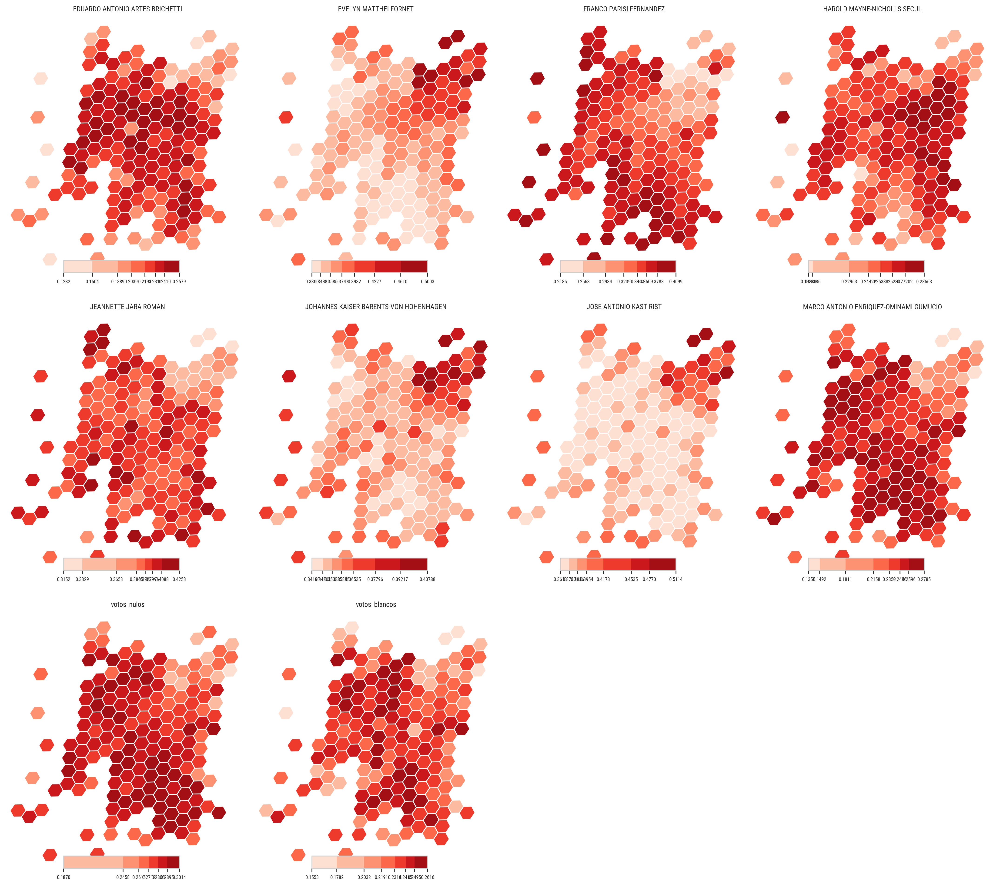

In [20]:
from chiricoca.geo.figures import small_multiples_from_geodataframe

from chiricoca.maps import choropleth_map

fig, axes = small_multiples_from_geodataframe(grid, len(grid_turnout.columns), col_wrap=4)

for ax, col in zip(axes, grid_turnout.columns):
    choropleth_map(grid_turnout_norm, col, ax=ax, binning='fisher_jenks')
    ax.set_title(col)

# Reportes ciudadanos

No puedo compartir estos datos así que solo está disponible la versión agregada en el repo.

In [21]:
import json

grid_n_reports = pd.read_parquet('data/presidenciales-2025-1ra/citizen_reports_grid.parquet')

In [22]:
grid_dtm = pd.read_parquet(
    "data/presidenciales-2025-1ra/citizen_reports_dtm.parquet"
)

with open("data/presidenciales-2025-1ra/frequent_tokens.json", "rt") as f:
    frequent_tokens = json.load(f)

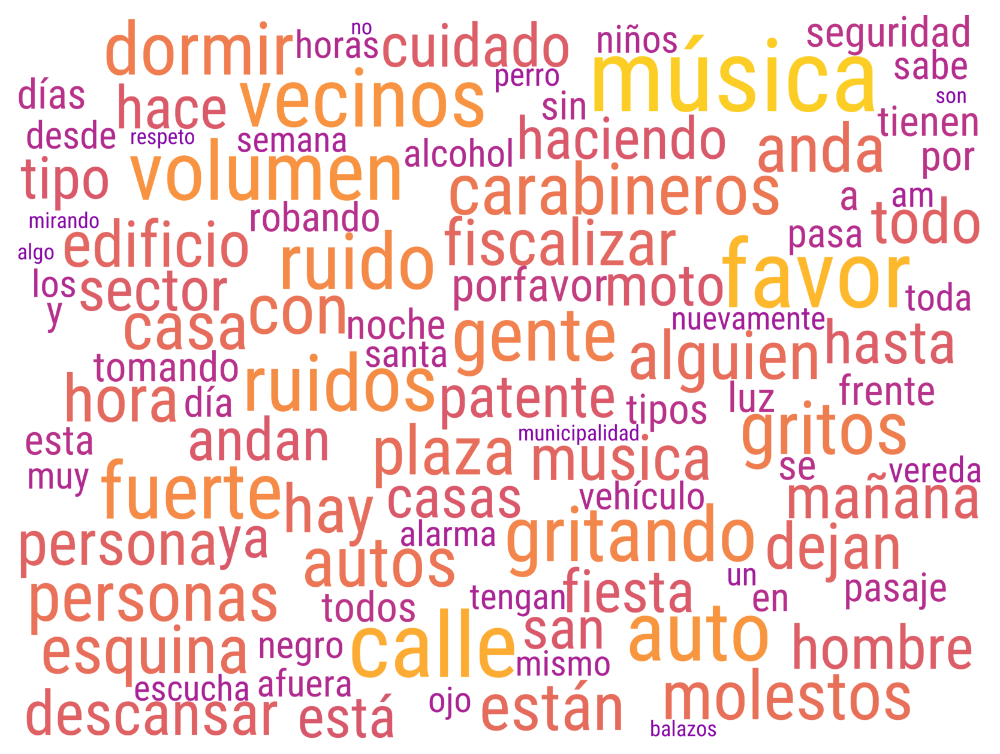

In [23]:
from chiricoca.text.word_cloud import wordcloud
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

wordcloud(
    frequent_tokens,
    max_words=100,
    max_font_size=400,
    relative_scaling=0.75,
    cmap="plasma",
    ax=ax,
)

ax.set_axis_off()

<Axes: ylabel='Frequency'>

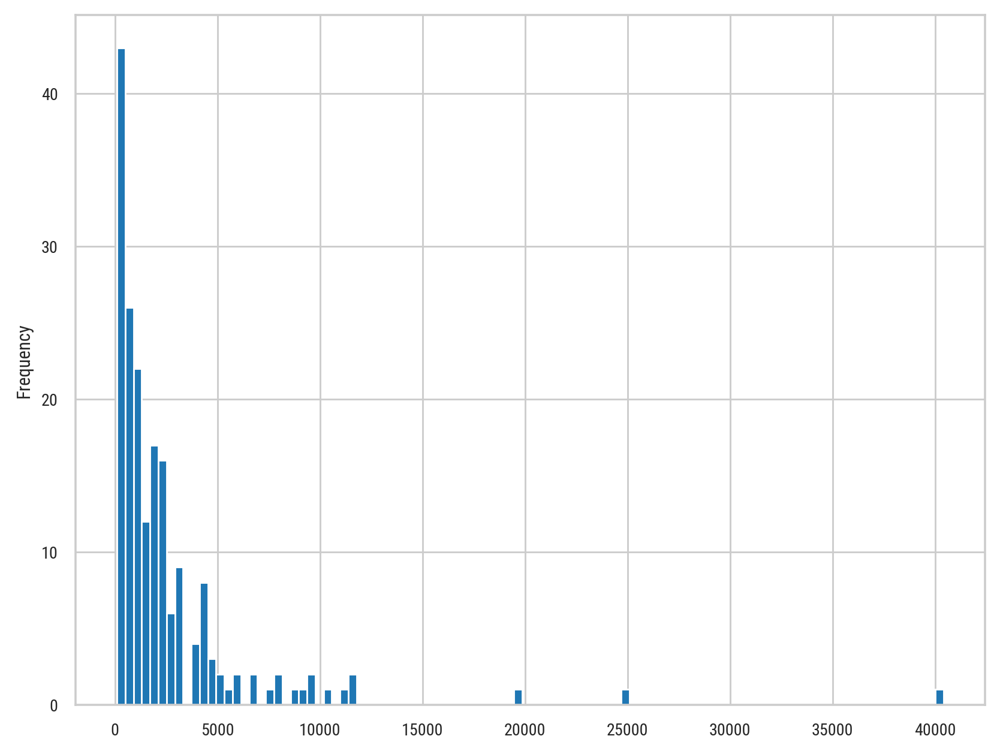

In [24]:
grid_n_reports['n_reports'].plot(kind='hist', bins=100)

<Axes: ylabel='Frequency'>

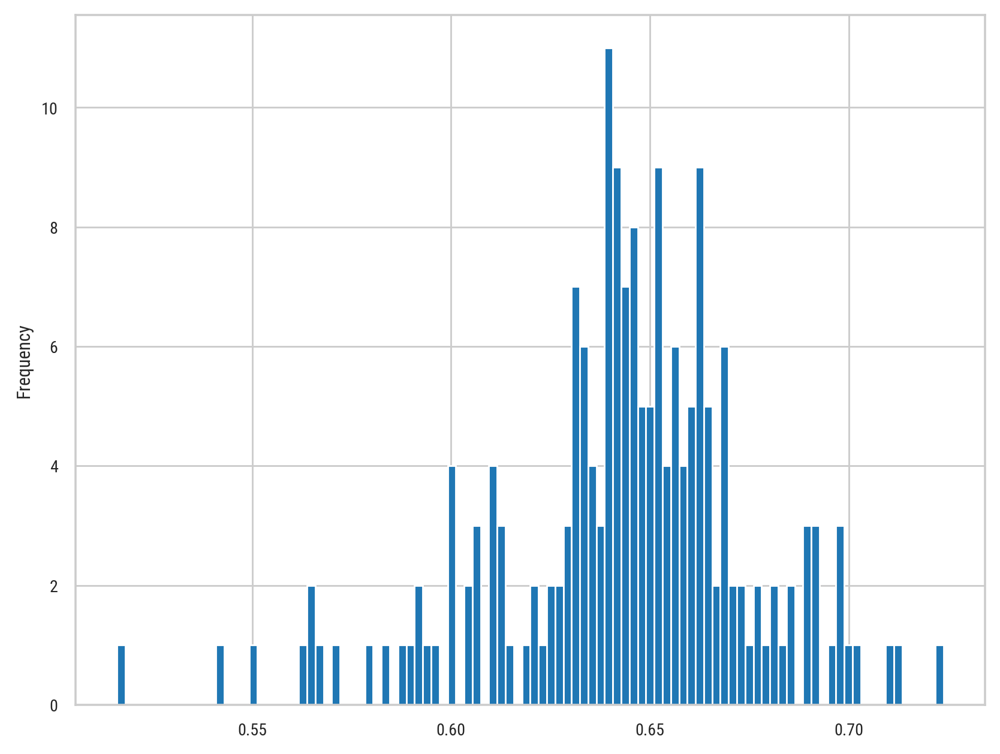

In [25]:
grid_n_reports['sentiment_NEG'].plot(kind='hist', bins=100)

<Axes: >

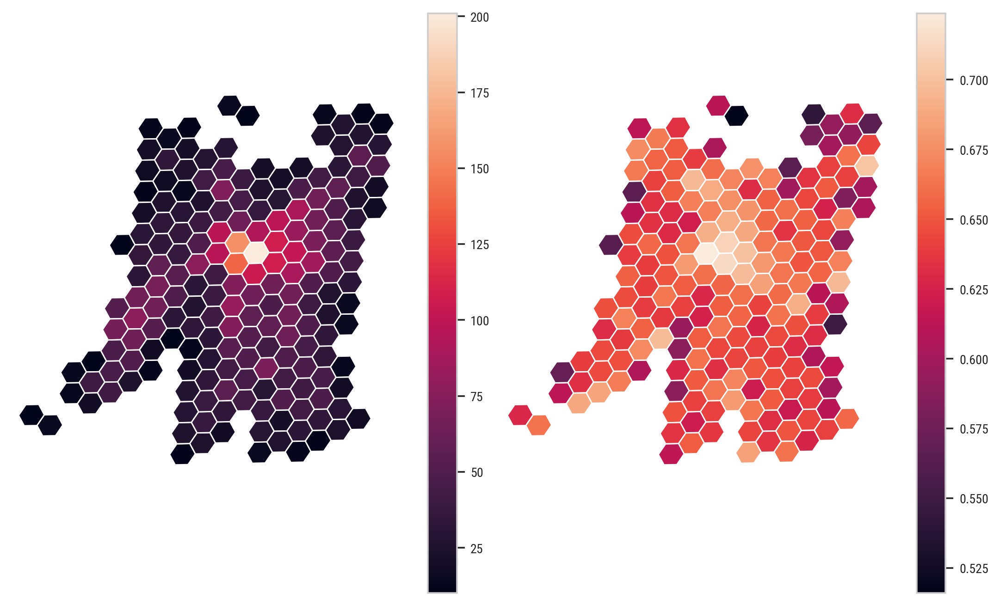

In [26]:
from chiricoca.geo.figures import small_multiples_from_geodataframe

fig, axes = small_multiples_from_geodataframe(grid, 2)

grid.join(np.sqrt(grid_n_reports), how='inner').plot(column='n_reports', legend=True, ax=axes[0])
grid.join(grid_n_reports['sentiment_NEG'], how='inner').plot(column='sentiment_NEG', legend=True, ax=axes[1])


# Clustering

In [27]:
group_options = [
    "EDUARDO ANTONIO ARTES BRICHETTI",
    "HAROLD MAYNE-NICHOLLS SECUL",
    "MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO",
]
group_order = [
    "JEANNETTE JARA ROMAN",
    "JOSE ANTONIO KAST RIST",
    "FRANCO PARISI FERNANDEZ",
    "EVELYN MATTHEI FORNET",
    "JOHANNES KAISER BARENTS-VON HOHENHAGEN",
    "OTROS",
]

short_names = {
    "JEANNETTE JARA ROMAN": 'JARA',
    "JOSE ANTONIO KAST RIST": 'KAST',
    "FRANCO PARISI FERNANDEZ": 'PARISI',
    "EVELYN MATTHEI FORNET": 'MATTHEI',
    "JOHANNES KAISER BARENTS-VON HOHENHAGEN": 'KAISER',
    "OTROS": 'OTROS'
}

grid_turnout_grouped = (
    grid_turnout.join(grid_n_reports[[]], how="inner")
    .assign(**{"OTROS": lambda x: x[group_options].sum(axis=1)})
    .drop(group_options, axis=1)[group_order]
)

grid_turnout_grouped.head()

,JEANNETTE JARA ROMAN,JOSE ANTONIO KAST RIST,FRANCO PARISI FERNANDEZ,EVELYN MATTHEI FORNET,JOHANNES KAISER BARENTS-VON HOHENHAGEN,OTROS
87b2c5082ffffff,2108,1490,736,1479,821,276
87b2c5084ffffff,9807,6237,5191,4425,3725,1254
87b2c5086ffffff,4454,3129,1297,3408,1579,595
87b2c5090ffffff,14579,8145,4930,6989,5248,1786
87b2c5091ffffff,22368,11912,6684,9584,7500,2529


In [28]:
from libpysal.weights import Queen
w = Queen.from_dataframe(grid.loc[grid_turnout_grouped.index])
connectivity = w.sparse
connectivity

/tmp/ipykernel_6599/35295695.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(grid.loc[grid_turnout_grouped.index])
/home/egraells/miniconda3/envs/aves/lib/python3.10/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  W.__init__(self, neighbors, ids=ids, **kw)


<160x160 sparse matrix of type '<class 'numpy.float64'>'
	with 788 stored elements in Compressed Sparse Row format>

/home/egraells/miniconda3/envs/aves/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:593: UserWarning: the number of connected components of the connectivity matrix is 3 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


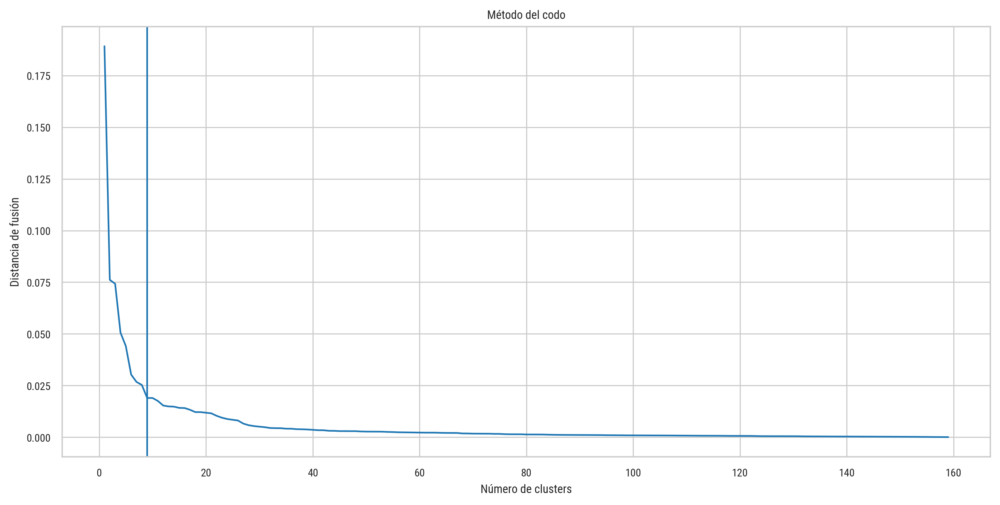

In [29]:
from sklearn.cluster import AgglomerativeClustering
from chiricoca.base.weights import variance_stabilization
import matplotlib.pyplot as plt
import numpy as np

cluster_args = dict(metric="cosine",
    linkage="complete",
    connectivity=connectivity)

model = AgglomerativeClustering(
    n_clusters=None,
    distance_threshold=0,
    compute_distances=True,
    **cluster_args
)
model.fit(grid_turnout_grouped.pipe(variance_stabilization).values)

# Graficar distancias de fusión
distances = model.distances_[::-1]  # invertir para ir de n clusters a 1
n_clusters = np.arange(1, len(distances) + 1)

plt.figure(figsize=(10, 5))
plt.plot(n_clusters, distances)
plt.xlabel("Número de clusters")
plt.ylabel("Distancia de fusión")
plt.title("Método del codo")
plt.axvline(x=9)
plt.show()

In [30]:

import matplotlib.pyplot as plt

model = AgglomerativeClustering(
    9, **cluster_args
)
clusters = model.fit_predict(grid_turnout_grouped.pipe(variance_stabilization).values)

grid_turnout_clustered = grid_turnout_grouped.assign(cluster=clusters)

/home/egraells/miniconda3/envs/aves/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:593: UserWarning: the number of connected components of the connectivity matrix is 3 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


In [31]:
cluster_size = grid_turnout_clustered.groupby('cluster').size().sort_values()
relevant_clusters = cluster_size[cluster_size >= 6]
relevant_clusters

cluster
8      6
1     17
4     26
0    103
dtype: int64

In [32]:
df_plot = (
    grid_turnout_clustered[
        grid_turnout_clustered["cluster"].isin(relevant_clusters.index)
    ]
    .groupby("cluster")
    .sum()
    .pipe(normalize_rows)
    .mul(100)
    .sort_values("FRANCO PARISI FERNANDEZ")
)

df_plot = pd.concat(
    [
        # clusters
        df_plot,
        # santiago
        total_turnout_scl.rename("Total SCL")
        .to_frame()
        .T.assign(**{"OTROS": lambda x: x[group_options].sum(axis=1)})
        .drop(group_options, axis=1)[group_order]
        .pipe(normalize_rows)
        .mul(100),
        # chile
        df[grid_turnout.columns]
        .assign(**{"OTROS": lambda x: x[group_options].sum(axis=1)})
        .drop(group_options, axis=1)[group_order]
        .sum()
        .rename("Total País")
        .to_frame()
        .T[group_order]
        .pipe(normalize_rows)
        .mul(100),
    ]
)

df_plot

,JEANNETTE JARA ROMAN,JOSE ANTONIO KAST RIST,FRANCO PARISI FERNANDEZ,EVELYN MATTHEI FORNET,JOHANNES KAISER BARENTS-VON HOHENHAGEN,OTROS
1,10.864297,33.733019,1.528048,38.686175,13.249804,1.938657
4,34.066946,19.333801,8.470751,21.860584,12.585042,3.682877
0,34.065221,19.883214,16.810159,12.795351,12.722493,3.723563
8,38.931380,17.578106,19.320619,9.196415,11.171707,3.801772
Total SCL,32.032030,21.062163,13.553120,17.077391,12.721401,3.553896
Total País,26.748978,23.956078,19.795004,12.440734,13.937948,3.121258


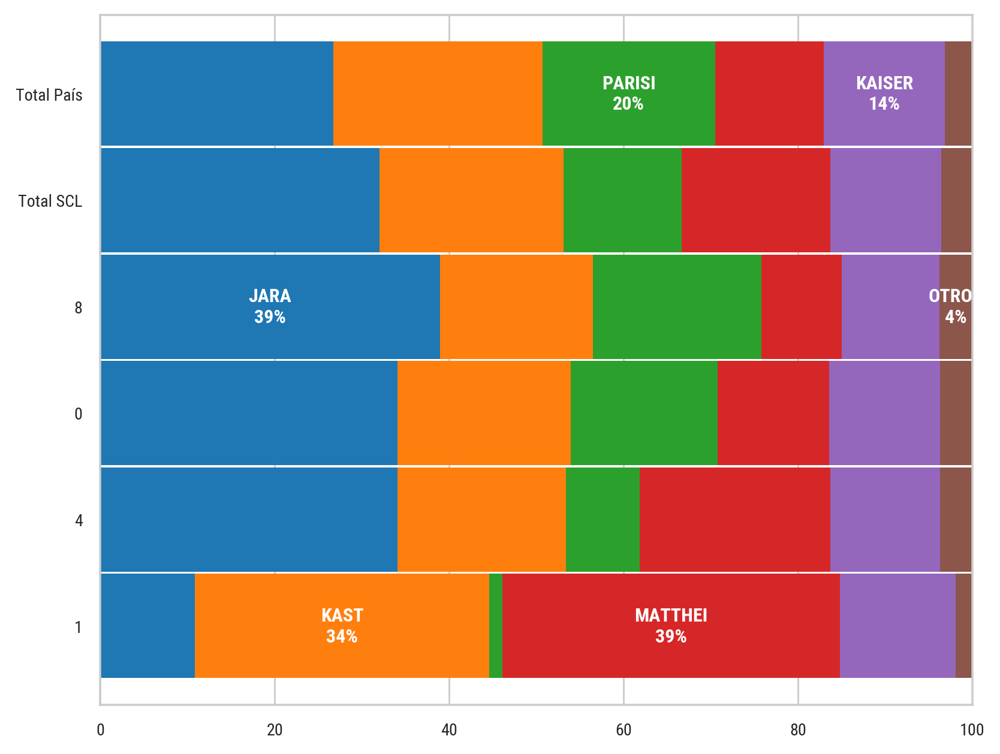

In [33]:
fig, ax = plt.subplots()

df_plot.plot(
    kind="barh", stacked=True, width=0.98, ax=ax, edgecolor="none", legend=False
)
ax.set_xlim([0, 100])

# Para cada categoría, encontrar dónde es más grande y poner su nombre ahí
for col in df_plot.columns:
    cluster_max = df_plot[col].idxmax()
    i = list(df_plot.index).index(cluster_max)

    # Calcular posición x (suma de columnas anteriores)
    col_idx = df_plot.columns.get_loc(col)
    left = df_plot.iloc[i, :col_idx].sum()
    width = df_plot.loc[cluster_max, col]

    ax.text(
        left + width / 2,
        i,
        f"{short_names[col]}\n{width:.0f}%",
        ha="center",
        va="center",
        fontsize=9,
        color="white",
        weight="bold",
    )

In [34]:
geo_clusters = grid.join(
    grid_turnout_clustered[
        grid_turnout_clustered["cluster"].isin(relevant_clusters.index)
    ]
).dissolve(by="cluster")
geo_clusters

,geometry,JEANNETTE JARA ROMAN,JOSE ANTONIO KAST RIST,FRANCO PARISI FERNANDEZ,EVELYN MATTHEI FORNET,JOHANNES KAISER BARENTS-VON HOHENHAGEN,OTROS
cluster,,,,,,,
0.0,"MULTIPOLYGON (((-70.89685 -33.61176, -70.90317...",17929.0,9613.0,4136.0,10251.0,6551.0,1901.0
1.0,"MULTIPOLYGON (((-70.59559 -33.41804, -70.60190...",5469.0,7771.0,727.0,9988.0,4529.0,780.0
4.0,"POLYGON ((-70.61508 -33.54752, -70.60689 -33.5...",10410.0,6467.0,3955.0,5164.0,4182.0,1173.0
8.0,"POLYGON ((-70.68135 -33.55860, -70.69588 -33.5...",1869.0,1156.0,1245.0,524.0,716.0,224.0


In [35]:
cluster_sentiment = (
    grid_turnout_clustered[
        grid_turnout_clustered["cluster"].isin(relevant_clusters.index)
    ]
    .join(grid_n_reports)
    .groupby("cluster")["sentiment_NEG"]
    .mean()
    .pipe(
        lambda x: (x - grid_n_reports["sentiment_NEG"].mean())
        / grid_n_reports["sentiment_NEG"].std()
    )
)

cluster_sentiment

cluster
0    0.189399
1   -0.492432
4    0.595255
8   -0.547288
Name: sentiment_NEG, dtype: float64

<Axes: >

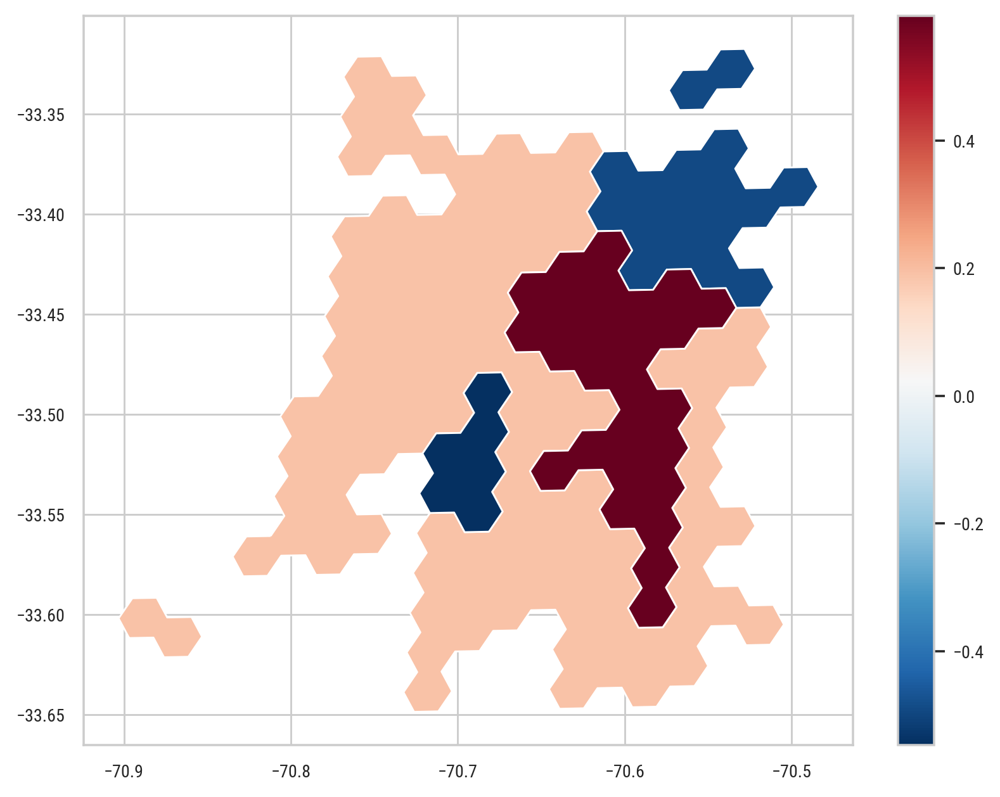

In [36]:
geo_clusters.join(cluster_sentiment).plot(column='sentiment_NEG', legend=True, cmap='RdBu_r')

# Visualización global

In [37]:
from pathlib import Path

basemap_path = Path('data/presidenciales-2025-1ra/scl_basemap.tif')

if not basemap_path.exists():
    import contextily as cx

    bounds = grid.buffer(0.015).to_crs('epsg:4326').total_bounds

    scl_img, scl_ext = cx.bounds2raster(
        bounds[0],
        bounds[1],
        bounds[2],
        bounds[3],
        basemap_path,
        ll=True,
        source=cx.providers.CartoDB.PositronNoLabels,
        zoom=12,
    )

In [38]:
gdf = geo_clusters.join(cluster_sentiment)

/tmp/ipykernel_6599/3932655952.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf.centroid.plot()


<Axes: >

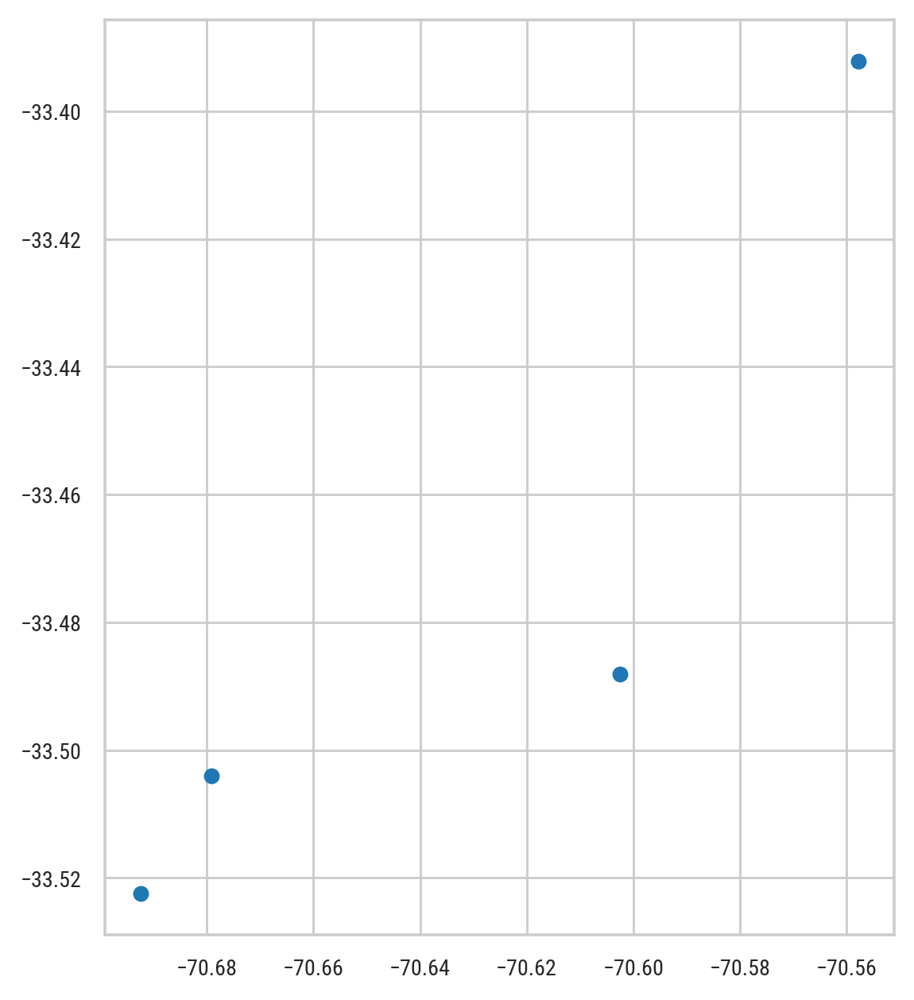

In [39]:
gdf.centroid.plot()

<Axes: >

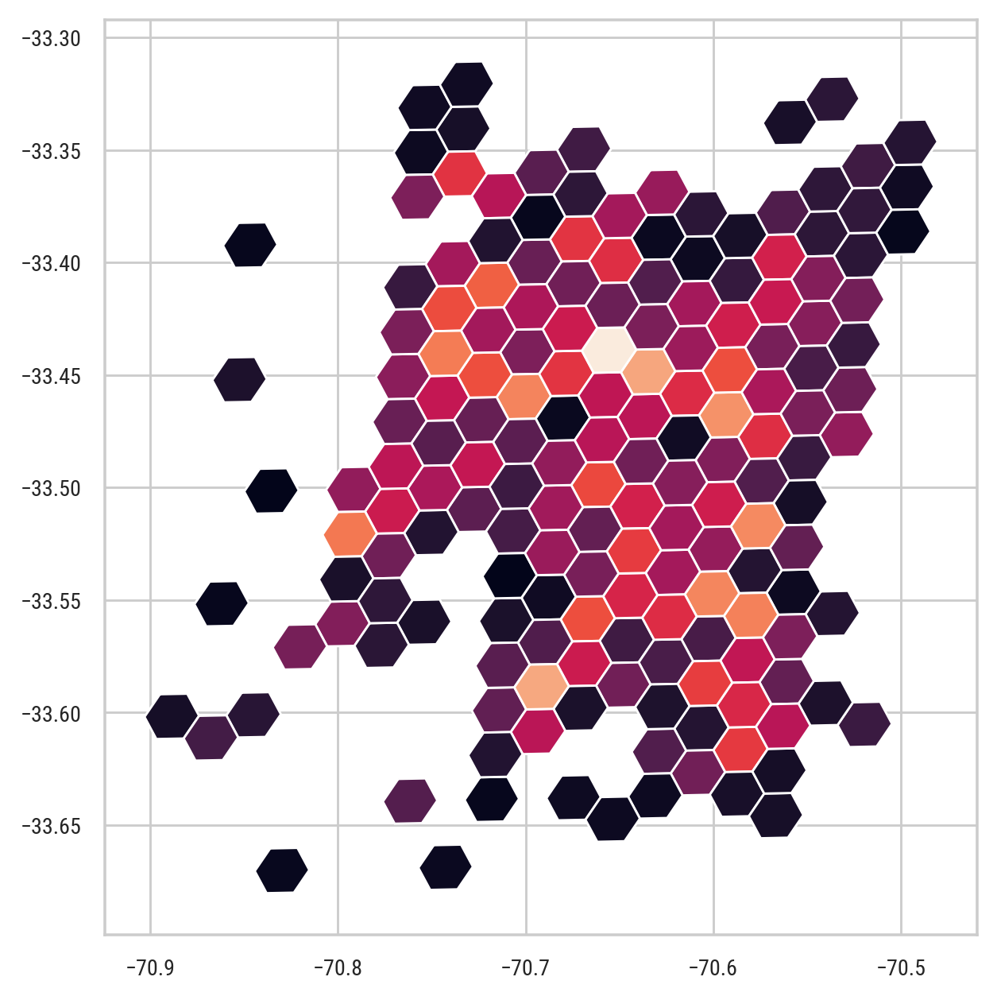

In [40]:
grid.join(grid_turnout.sum(axis=1).rename('n_votos')).dropna().plot(column='n_votos')

In [41]:
sns.set_palette('plasma', n_colors=len(df_plot.columns))

Text(1.0, 1.0, 'Datos: SERVEL, SOSAFE, INE. Mapa base: CartoDB Positron\nCódigo: github.com/PLUMAS-research/visualization-course-materials')

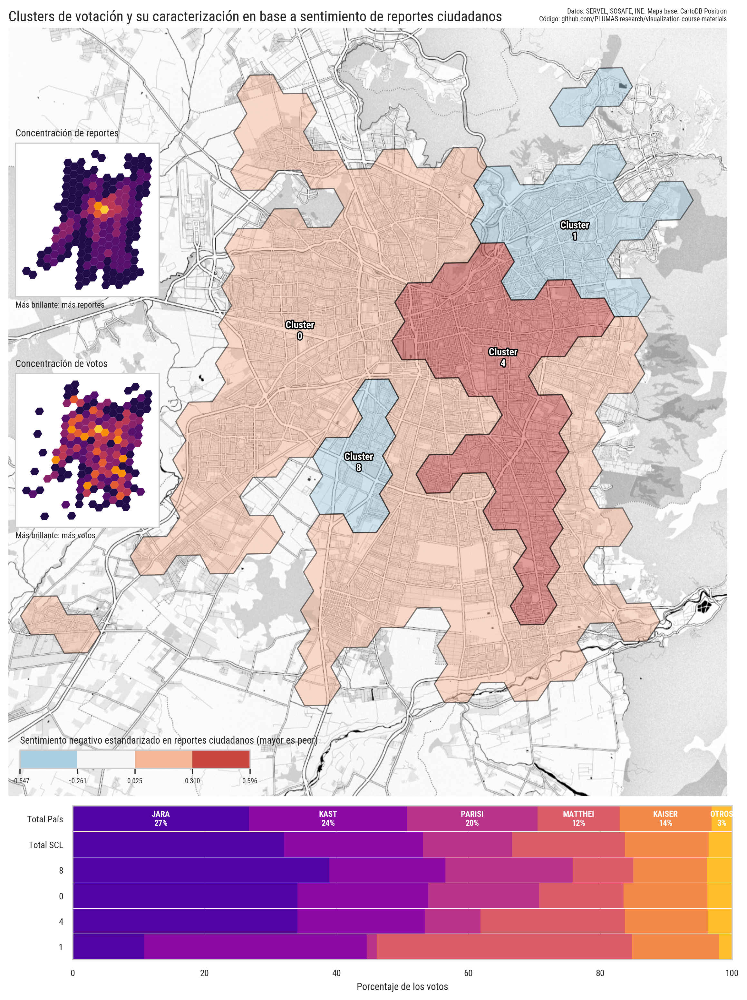

In [42]:
from chiricoca.geo.figures import figure_from_geodataframe, set_axis_aspect
from chiricoca.maps.utils import geographical_labels
from chiricoca.maps.utils import add_basemap
from chiricoca.maps.choropleth import choropleth_map
import matplotlib.gridspec as gridspec

#fig, ax = figure_from_geodataframe(grid)

fig = plt.figure(figsize=(9,12))

gs = gridspec.GridSpec(
    2,
    2,
    figure=fig,
    #hspace=0.15,
    #wspace=0.05,
    width_ratios=[0.025, 1],
    height_ratios=[2, 0.4]
)

ax = fig.add_subplot(gs[0,:])

bounds = grid.total_bounds
ax.set_xlim([bounds[0], bounds[2]])
ax.set_ylim([bounds[1], bounds[3]])
#ax.set_aspect('equal')
set_axis_aspect(ax, grid)
ax.set_axis_off()

add_basemap(ax, basemap_path, grid, reset_extent=False)


ax_n_reports = ax.inset_axes([0.01, 0.65, 0.2, 0.2])

choropleth_map(grid.join(np.sqrt(grid_n_reports), how='inner'), 'n_reports', ax=ax_n_reports, palette='inferno', edgecolor='none', legend=None)
#ax_n_reports.set_axis_off()
ax_n_reports.set_title('Concentración de reportes', loc='left')
ax_n_reports.set_xlabel('Más brillante: más reportes', loc='left', fontsize='small')
ax_n_reports.set_xticks([])
ax_n_reports.set_yticks([])

ax_n_votos = ax.inset_axes([0.01, 0.35, 0.2, 0.2])

choropleth_map(grid.join(grid_turnout.sum(axis=1).rename('n_votos')).dropna(), column='n_votos', ax=ax_n_votos, palette='inferno', edgecolor='none', legend=None)
#ax_n_votos.set_axis_off()
ax_n_votos.set_title('Concentración de votos', loc='left')
ax_n_votos.set_xlabel('Más brillante: más votos', loc='left', fontsize='small')
ax_n_votos.set_xticks([])
ax_n_votos.set_yticks([])


ax_plot = fig.add_subplot(gs[1,1])

#grid.plot(ax=ax, aspect=None, facecolor='none')

choropleth_map(
    gdf,
    "sentiment_NEG",
    binning="uniform",
    k=4,
    ax=ax,
    edgecolor="black",
    alpha=0.5,
    cbar_args=dict(
        location="lower left", bbox_to_anchor=[0.01, 0.03, 0.8, 0.8], width="40%", height="3%", label='Sentimiento negativo estandarizado en reportes ciudadanos (mayor es peor)', title_size='medium'
    ),
)

#gdf.centroid.plot(ax=ax)
geographical_labels(
    ax,
    gdf,
    format_func=lambda x: f"Cluster\n{x:.0f}",
    font_size="medium",
    displacements={0: (-0.05, 0.05), 4: (0, 0.02), 1: (0, -0.01)},
)

df_plot.plot(kind="barh", stacked=True, width=0.98, ax=ax_plot, edgecolor="none", legend=False)
ax_plot.set_xlim([0, 100])
ax_plot.set_ylabel('')
ax_plot.set_ylim([-0.5, 5.5])
ax_plot.set_xlabel('Porcentaje de los votos')

# Para cada categoría, encontrar dónde es más grande y poner su nombre ahí
for col in df_plot.columns:
    cluster_max = 'Total País'#df_plot[col].idxmax()
    i = list(df_plot.index).index(cluster_max)
    
    # Calcular posición x (suma de columnas anteriores)
    col_idx = df_plot.columns.get_loc(col)
    left = df_plot.iloc[i, :col_idx].sum()
    width = df_plot.loc[cluster_max, col]
    
    ax_plot.text(left + width/2, i, f'{short_names[col]}\n{width:.0f}%', 
           ha='center', va='center', fontsize='small', color='white', weight='bold')
    
ax.set_title('Clusters de votación y su caracterización en base a sentimiento de reportes ciudadanos', loc='left', fontsize='x-large')

ax.set_title('Datos: SERVEL, SOSAFE, INE. Mapa base: CartoDB Positron\nCódigo: github.com/PLUMAS-research/visualization-course-materials', loc='right', fontsize='x-small')

# Focalización 1: ¿Qué caracteriza a cada cluster?

In [43]:
population = pd.read_csv(
    "data/censo2024/D1_Poblacion-censada-por-sexo-y-edad-en-grupos-quinquenales.csv",
    thousands=",",
    decimal=".",
)
population.head()

,Código región,Región,Código provincia,Provincia,Código comuna,Comuna,Grupos de edad,Población censada,Hombres,Mujeres,Razón hombre-mujer
0,0,País,0,País,0,País,Total País,18480432,8967033,9513399,94.3
1,0,País,0,País,0,País,0 a 4,870693,443028,427665,103.6
2,0,País,0,País,0,País,5 a 9,1147515,584218,563297,103.7
3,0,País,0,País,0,País,10 a 14,1256440,641284,615156,104.2
4,0,País,0,País,0,País,15 a 19,1219347,625986,593361,105.5


In [44]:
comunas = gpd.read_file('data/comunas_rm/COMUNA_C17.shp')
comunas.head()

,REGION,NOM_REGION,PROVINCIA,NOM_PROVIN,COMUNA,NOM_COMUNA,SHAPE_Leng,SHAPE_Area,geometry
0,13,REGIÓN METROPOLITANA DE SANTIAGO,134,MAIPO,13404,PAINE,1.625330,0.066035,"POLYGON ((-70.61889 -33.73808, -70.61811 -33.7..."
1,13,REGIÓN METROPOLITANA DE SANTIAGO,134,MAIPO,13402,BUIN,0.884164,0.021166,"POLYGON ((-70.63192 -33.64634, -70.63207 -33.6..."
2,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,13124,PUDAHUEL,0.720176,0.019124,"POLYGON ((-70.78914 -33.36153, -70.78824 -33.3..."
3,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,13103,CERRO NAVIA,0.170180,0.001076,"POLYGON ((-70.71927 -33.41334, -70.71888 -33.4..."
4,13,REGIÓN METROPOLITANA DE SANTIAGO,133,CHACABUCO,13301,COLINA,1.692007,0.093820,"POLYGON ((-70.59630 -32.95138, -70.59673 -32.9..."


In [45]:
population_comuna = (
    population.rename({"Código comuna": "COMUNA"}, axis=1)
    .groupby(["COMUNA", "Grupos de edad"])["Población censada"]
    .sum()
    .reset_index()
)

population_comuna.head(25)

,COMUNA,Grupos de edad,Población censada
0,0,0 a 4,870693
1,0,10 a 14,1256440
2,0,15 a 19,1219347
3,0,20 a 24,1273193
4,0,25 a 29,1383669
5,0,30 a 34,1527489
6,0,35 a 39,1408198
7,0,40 a 44,1270493
8,0,45 a 49,1151776
9,0,5 a 9,1147515


In [46]:
population_comuna['Población censada'].sum()

73921728

<Axes: >

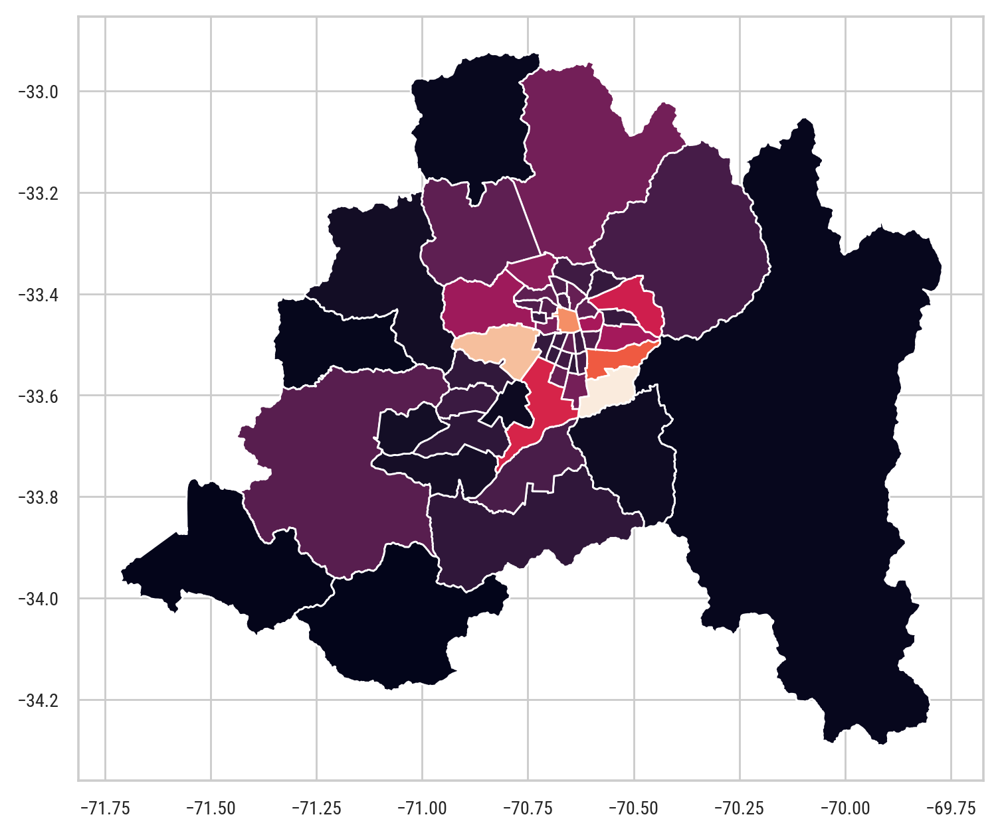

In [47]:
comunas.assign(COMUNA=lambda x: x["COMUNA"].astype(int)).join(
    population_comuna.groupby("COMUNA")["Población censada"].sum(), on="COMUNA"
).plot(column="Población censada")

In [48]:
grid_comuna = gpd.overlay(
    grid.join(grid_turnout_clustered[["cluster"]]).reset_index(),
    comunas[["COMUNA", "geometry"]].to_crs(grid.crs),
).assign(
    COMUNA=lambda x: x["COMUNA"].astype(int),
    area_m2=lambda x: x.to_crs("epsg:5361").area,
)

grid_comuna.head()

,h3_cell_id,cluster,COMUNA,geometry,area_m2
0,87b2c5464ffffff,0.0,13121,"POLYGON ((-70.67568 -33.49893, -70.66748 -33.4...",1.382867e+06
1,87b2c555dffffff,0.0,13121,"MULTIPOLYGON (((-70.67159 -33.47632, -70.67159...",2.008447e+05
2,87b2c5460ffffff,0.0,13121,"POLYGON ((-70.67094 -33.51068, -70.67095 -33.5...",1.663133e+01
3,87b2c5466ffffff,8.0,13121,"POLYGON ((-70.69020 -33.49917, -70.67568 -33.4...",1.539545e+06
4,87b2c5559ffffff,8.0,13121,"POLYGON ((-70.67379 -33.47902, -70.66748 -33.4...",3.715206e+06


In [49]:
grid_comuna_weight = (
    pd.pivot_table(grid_comuna, values="area_m2", index="COMUNA", columns="h3_cell_id")
    .fillna(0)
    .pipe(normalize_rows)
    .stack()
    .rename("area_weight")
    .to_frame()
    .pipe(lambda x: x[x["area_weight"] > 0])
)

grid_comuna_weight.head()

area_weight
COMUNA h3_cell_id                   
13101  87b2c5540ffffff  8.357140e-02
       87b2c5541ffffff  1.757865e-01
       87b2c5542ffffff  1.271390e-02
       87b2c5543ffffff  1.163420e-01
       87b2c5545ffffff  4.023744e-07

In [50]:
grid_population = (
    grid_comuna.merge(population_comuna)
    .groupby(["h3_cell_id", "COMUNA"])["Población censada"]
    .sum()
    .rename("cell_population")
    .to_frame()
    .join(grid_comuna_weight)
    .assign(weighted_population=lambda x: x["cell_population"] * x["area_weight"])
    .reset_index()
    [['h3_cell_id', 'COMUNA', 'weighted_population']]
)

grid_population

,h3_cell_id,COMUNA,weighted_population
0,87b2c5080ffffff,13122,43586.626785
1,87b2c5081ffffff,13110,40500.399858
2,87b2c5081ffffff,13122,10524.123832
3,87b2c5082ffffff,13110,10350.807740
4,87b2c5082ffffff,13122,35143.101286
...,...,...,...
667,87b2c5cddffffff,13107,10496.184454
668,87b2c5cddffffff,13301,21115.635843
669,87b2c5cdeffffff,13125,30334.849168
670,87b2c5cdeffffff,13301,2388.364186


In [51]:
relevant_clusters

cluster
8      6
1     17
4     26
0    103
dtype: int64

In [52]:
relevant_clusters.index.values

array([8, 1, 4, 0])

In [53]:
8 in relevant_clusters.index

True

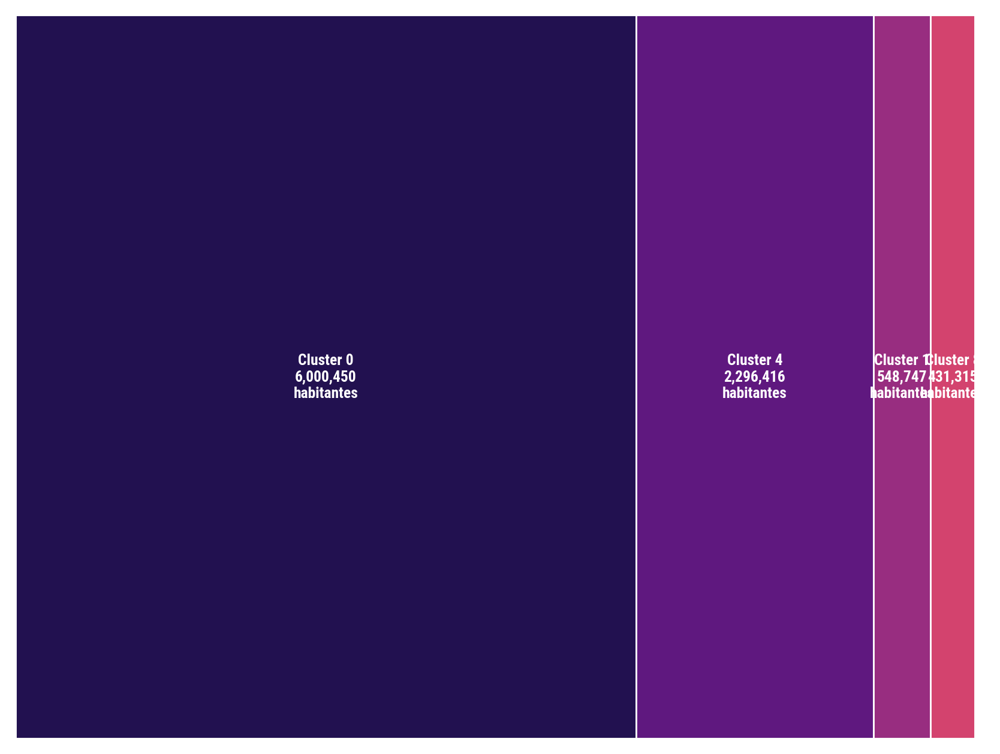

In [54]:
cluster_population = (
    grid_comuna.merge(grid_population)
    .assign(
        cluster_label=lambda x: x["cluster"].map(
            lambda c: f"Cluster {c:.0f}" if c in relevant_clusters else "Sin agrupación"
        )
    )
    .groupby("cluster_label")["weighted_population"]
    .sum()
    .loc[reversed([f"Cluster {c:.0f}" for c in relevant_clusters.index])]
    .to_frame()
    .T
)

fig, ax = plt.subplots()

sns.set_palette('magma')
cluster_population.plot(ax=ax, kind='barh', stacked=True, width=1, legend=False)

left = 0

for col in cluster_population.columns:
    width = cluster_population[col].values[0]
    ax.text(left + width/2, 0, f'{col}\n{width:,.0f}\nhabitantes', 
           ha='center', va='center', fontsize='small', color='white', weight='bold')
    left += cluster_population[col].values[0]

ax.set_xlim([0, cluster_population.sum().sum()])
ax.set_ylim([-0.5, 0.5])
ax.set_axis_off()

In [55]:
cluster_dtm = (
    grid_dtm[grid_dtm >= 100].fillna(0).pipe(lambda x: tfidf(x, norm='l2'))
    .join(grid_turnout_clustered[["cluster"]])
    .groupby("cluster")
    .sum()
)

for idx, row in cluster_dtm.iterrows():
    print(idx)
    print(row.sort_values(ascending=False).head(5).index)

0.0
Index(['pasaje', 'balazos', 'villa', 'san', 'anda'], dtype='object')
1.0
Index(['vitacura', 'apoquindo', 'camino', 'condes', 'costanera'], dtype='object')
2.0
Index(['carmen', 'pedro', 'independencia', 'julio', 'norte'], dtype='object')
3.0
Index(['condes', 'carreras', 'costanera', 'edificio', 'rosas'], dtype='object')
4.0
Index(['vicuña', 'edificio', 'florida', 'mackenna', 'metro'], dtype='object')
5.0
Index(['apoquindo', 'escuela', 'block', 'depto', 'c'], dtype='object')
6.0
Index(['mirador', 'camino', 'cerro', 'yapo', 'norte'], dtype='object')
7.0
Index(['volumen', 'vecinos', 'favor', 'auto', 'música'], dtype='object')
8.0
Index(['carabineros', 'calle', 'vespucio', 'autopista', 'central'], dtype='object')


0.0
4.0
1.0
8.0


Text(0.5, 0.98, 'Palabras más asociadas en reportes ciudadanos a cada cluster')

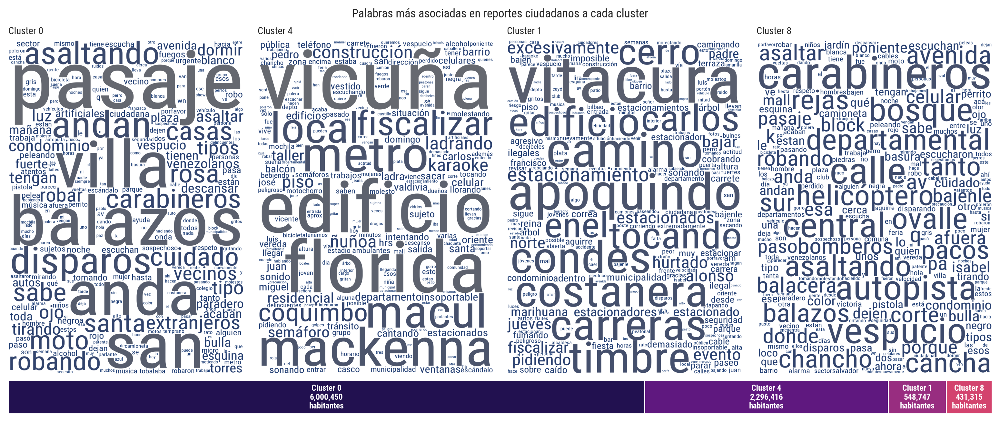

In [56]:
fig = plt.figure(figsize=(12,5))

gs = gridspec.GridSpec(
    2,
    4,
    figure=fig,
    #hspace=0.15,
    #wspace=0.05,
    width_ratios=[1,1,1,1],
    height_ratios=[2, 0.2]
)

axes = [fig.add_subplot(gs[0,i]) for i in range(4)]


for ax, (idx, row) in zip(axes, cluster_dtm.loc[reversed(relevant_clusters.index)].iterrows()):
    print(idx)
    ax.set_title(f'Cluster {idx:.0f}', loc='left')
    wordcloud(row[row > 0].to_dict(), ax=ax, cmap='cividis')
    ax.set_axis_off()

ax = fig.add_subplot(gs[1,:])
cluster_population.plot(ax=ax, kind='barh', stacked=True, width=1, legend=False)

left = 0

for col in cluster_population.columns:
    width = cluster_population[col].values[0]
    ax.text(left + width/2, 0, f'{col}\n{width:,.0f}\nhabitantes', 
           ha='center', va='center', fontsize='small', color='white', weight='bold')
    left += cluster_population[col].values[0]

ax.set_xlim([0, cluster_population.sum().sum()])
ax.set_ylim([-0.5, 0.5])
ax.set_axis_off()

fig.suptitle('Palabras más asociadas en reportes ciudadanos a cada cluster')

# Focalización 2: ¿Relación entre votos de Parisi y las demás candidaturas?

In [57]:
scl_locales

,adm_region,adm_provincia,adm_comuna,adm_local,geometry,EDUARDO ANTONIO ARTES BRICHETTI,EVELYN MATTHEI FORNET,FRANCO PARISI FERNANDEZ,HAROLD MAYNE-NICHOLLS SECUL,JEANNETTE JARA ROMAN,JOHANNES KAISER BARENTS-VON HOHENHAGEN,JOSE ANTONIO KAST RIST,MARCO ANTONIO ENRIQUEZ-OMINAMI GUMUCIO,validamente_emitidos,votos_nulos,votos_blancos,total_votacion
0,METROPOLITANA DE SANTIAGO,SANTIAGO,CERRO NAVIA,ESCUELA ALIANZA,POINT (-70.76225 -33.41491),39,473,1028,47,1417,558,898,76,4536,121,41,4698
2,METROPOLITANA DE SANTIAGO,SANTIAGO,PEDRO AGUIRRE CERDA,CENTRO EDUCATIVO REPUBLICA MEXICANA,POINT (-70.66525 -33.48877),79,797,714,114,2662,933,1155,79,6533,167,68,6768
5,METROPOLITANA DE SANTIAGO,TALAGANTE,PADRE HURTADO,LICEO PATRICIO MEKIS DE PADRE HURTADO,POINT (-70.81016 -33.57472),30,287,923,38,1076,421,684,53,3512,89,40,3641
2323,DEL MAULE,TALCA,SAN CLEMENTE,ESCUELA SAN CLEMENTE,POINT (-70.67080 -33.33972),11,210,670,26,677,357,947,46,2944,73,19,3036
2390,METROPOLITANA DE SANTIAGO,CHACABUCO,LAMPA,COLEGIO SOL DEL VALLE,POINT (-70.74153 -33.32492),31,924,869,99,1608,756,1425,61,5773,98,16,5887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3362,METROPOLITANA DE SANTIAGO,TALAGANTE,PEÑAFLOR,ESCUELA ESPECIAL NAZARETH,POINT (-70.86164 -33.60175),6,247,446,21,677,267,416,42,2122,47,12,2181
3363,METROPOLITANA DE SANTIAGO,TALAGANTE,PEÑAFLOR,ESCUELA MALLOCO,POINT (-70.85336 -33.60388),36,738,903,98,1744,802,1202,77,5600,132,49,5781
3366,METROPOLITANA DE SANTIAGO,TALAGANTE,PEÑAFLOR,ESCUELA ROSALINA PESCIO VARGAS,POINT (-70.87871 -33.59988),21,515,676,50,1266,591,758,74,3951,103,28,4082
3368,METROPOLITANA DE SANTIAGO,TALAGANTE,PEÑAFLOR,LICEO COMERCIAL REPUBLICA DE BRASIL,POINT (-70.85295 -33.60227),24,806,788,89,1603,803,1162,73,5348,146,37,5531


In [58]:
locales_turnout = (
    scl_locales.assign(**{"OTROS": lambda x: x[group_options].sum(axis=1)})
    .drop(group_options, axis=1)[group_order]
    .pipe(normalize_rows).mul(100)
    .rename(short_names, axis=1)
)

print(locales_turnout.head().to_csv())

,JARA,KAST,PARISI,MATTHEI,KAISER,OTROS
0,31.238977072310405,19.797178130511465,22.663139329805997,10.427689594356261,12.3015873015873,3.571428571428571
2,40.74697688657585,17.67947344252258,10.929129037195775,12.19960202051125,14.281340884739016,4.1634777284555335
5,30.637813211845106,19.47608200455581,26.281321184510247,8.171981776765376,11.9874715261959,3.4453302961275627
2323,22.995923913043477,32.16711956521739,22.758152173913043,7.133152173913043,12.126358695652174,2.8192934782608696
2390,27.85380218257405,24.68387320284081,15.05283214966222,16.005543045210462,13.095444309717653,3.3085051099948033



/home/egraells/miniconda3/envs/aves/lib/python3.10/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
/home/egraells/miniconda3/envs/aves/lib/python3.10/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
/home/egraells/miniconda3/envs/aves/lib/python3.10/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)
/home/egraells/miniconda3/envs/aves/lib/python3.10/site-packages/ternary/plotting.py:148: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(xs, ys, vmin=vmin, vmax=vmax, **kwargs)


Text(0.5, 0.98, 'Votaciones por local entre JARA, KAST y las otras candidaturas')

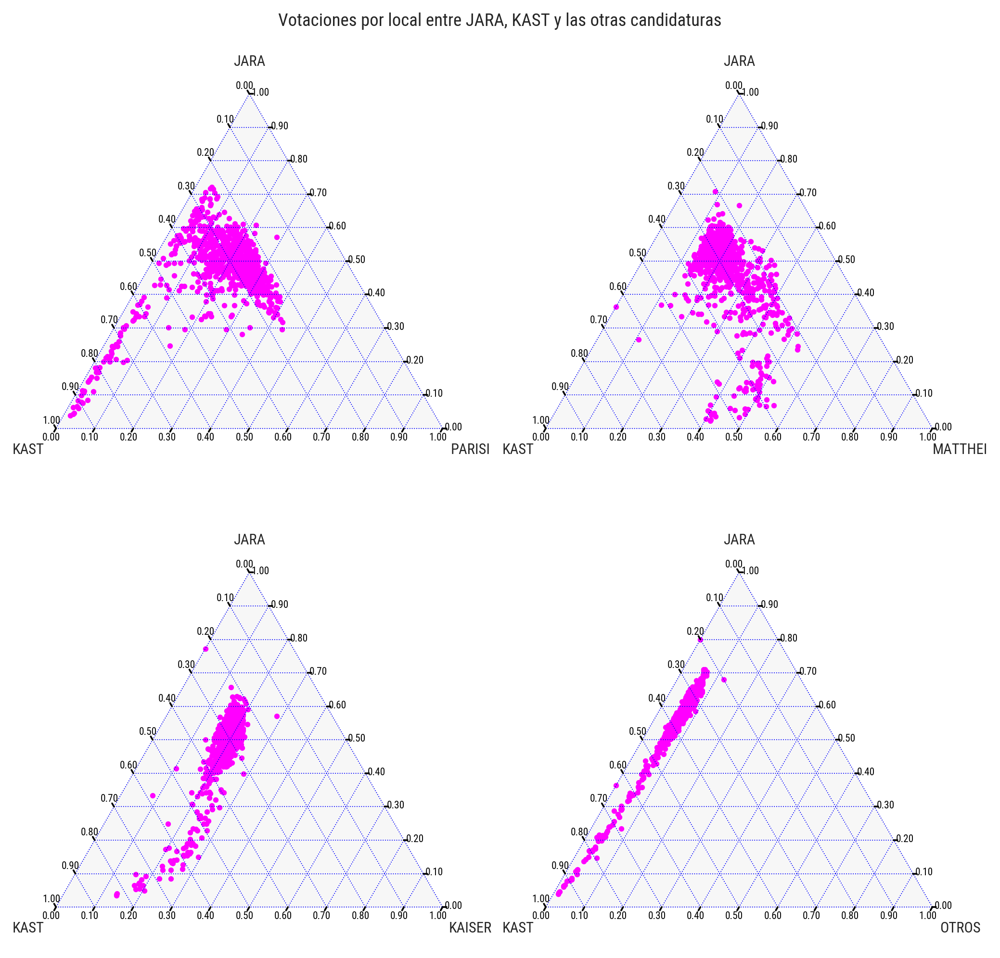

In [59]:
import ternary

fig, axes = plt.subplots(2, 2, figsize=(8, 8))


for ax, col in zip(axes.flatten(), locales_turnout.columns[2:]):
    ax.set_aspect('equal')
    tax = ternary.TernaryAxesSubplot(ax=ax)

    _df = locales_turnout[[col, 'JARA', 'KAST']].pipe(normalize_rows)

    tax.scatter(_df.values, s=None, marker=".", color="magenta")
    
    tax.right_corner_label(_df.columns[0])
    tax.top_corner_label(_df.columns[1])
    tax.left_corner_label(_df.columns[2])

    tax.gridlines(multiple=0.1, color="blue")
    tax.ticks(
         axis="lbr", linewidth=1, multiple=0.1, tick_formats="%.2f", fontsize="x-small"
    )
    # tax.clear_matplotlib_ticks()
    tax.get_axes().axis("off")

fig.suptitle('Votaciones por local entre JARA, KAST y las otras candidaturas', fontsize='large')
